<div style="background: #DDE2FF;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 20px 5px 0px 5px; 
            border: 10px solid #DDE2FF; 
            margin-left: 1px;
            margin-right: 1px;"
          
 <font color='blue'>**Trefethen p15 to p27**.
 
 This notebook showcases the second thirteen problems in Trefethen's classic book _Spectral Methods in MATLAB_. These problems have been ported to Python by Praveen Chandrashekar. Later problems in the set will have been ported to Python by Orlando Camargo Rodríguez. <br><br>
 
 

    
</font>
</div>



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 15 : Solve eigenvalue BVP


</font>
</div>



<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve the eigenvalue BVP

$$\,u_{xx}\,=\,\lambda u \hspace{2 cm}u(-1)\,=\,u(1)\,=\,0$$
</font>
</div>

In [31]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from numpy import dot,argsort,linspace,shape,zeros,polyval,polyfit,pi,real
#from chebPy import cheb
from scipy.linalg import solve,eig
from matplotlib.pyplot import figure,subplot,plot,title,axis


In [32]:
from numpy import pi,cos,arange,ones,tile,dot,eye,diag

def cheb(N):
    '''Chebushev polynomial differentiation matrix.
       Ref.: Trefethen's 'Spectral Methods in MATLAB' book.
    '''
    x      = cos(pi*arange(0,N+1)/N)
    if N%2 == 0:
        x[N//2] = 0.0 # only when N is even!
    c      = ones(N+1); c[0] = 2.0; c[N] = 2.0
    c      = c * (-1.0)**arange(0,N+1)
    c      = c.reshape(N+1,1)
    X      = tile(x.reshape(N+1,1), (1,N+1))
    dX     = X - X.T
    D      = dot(c, 1.0/c.T) / (dX+eye(N+1))
    D      = D - diag( D.sum(axis=1) )
    return D,x


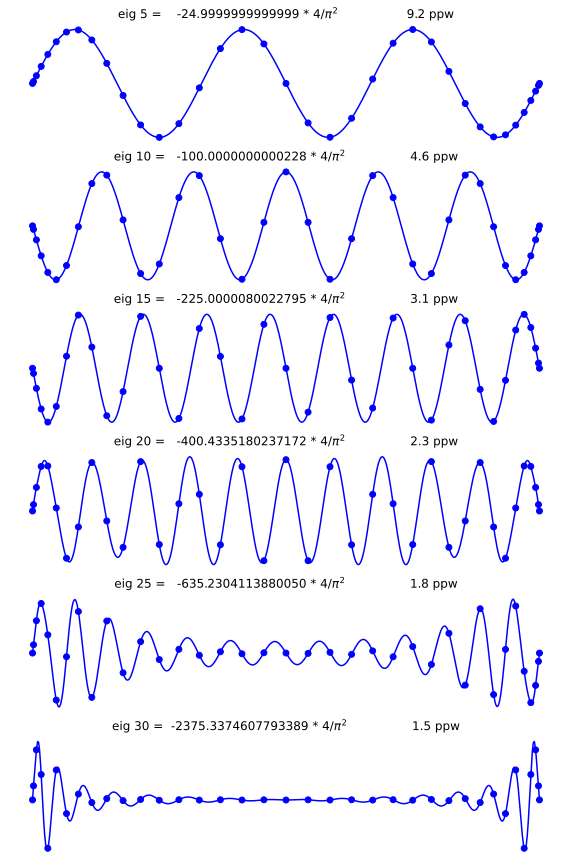

In [40]:
N = 36
D,x = cheb(N)
D2 = dot(D,D)
D2 = D2[1:N,1:N]

lam,V = eig(D2)   
ii = argsort(-lam)
lam = real(lam[ii])
V = V[:,ii]

fig = figure(figsize=(10,15))
for j in range(5,35,5):              
    lv = shape(V)[0]+2
    u = zeros(lv)
    u[1:lv-1] = V[:,int(j)]  
    subplot(6,1,j//5)
    plot(x,u,'bo')
    xx = linspace(-1.0,1.0,501)
    uu = polyval(polyfit(x,u,N),xx)    # interpolate grid data
    s = 'eig %d = %20.13f * 4/$\pi^2$' %(j,lam[j-1]*4/pi**2)
    s = s + '\t\t %4.1f ppw' % (4*N/(pi*j))
    title(s)
    plot(xx,uu,'b')
    axis('off')
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 15. Eigenvalues and eigenmodes of $\tilde{D}_N^2\,$ and the number of grid points per wavelength $\,\textsf{ppw}\,$ at the center of the grid.


</font>
</div>


<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 16 : Poisson equation on [-1,1]$\scriptsize{\times}$[-1,1] with $\,u\,=\,0\,$ on boundary


</font>
</div>


<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve the following Poisson problem

$$
u_{xx} + u_{yy} = 10\sin(8x(y-1)), \qquad -1 < x,y < 1, \qquad u=0 \quad \mbox{on boundary}
$$
</font>
</div>

In [29]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#from chebPy import cheb
from numpy import meshgrid,sin,dot,eye,kron,zeros,reshape,linspace
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import figure,subplot,plot,title,axis,xlabel,ylabel,spy
from matplotlib import cm
from scipy.linalg import solve
from scipy.interpolate import interp2d
#from scipy.interpolate import RegularGridInterpolator



C:\Users\gary\AppData\Local\Temp\ipykernel_11028\799811243.py:18: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  f = interp2d(x,y,uu,kind='cubic')
C:\Users\gary\AppData\Local\Temp\ipykernel_11028\799811243.py:21: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
        scattered 2D data.


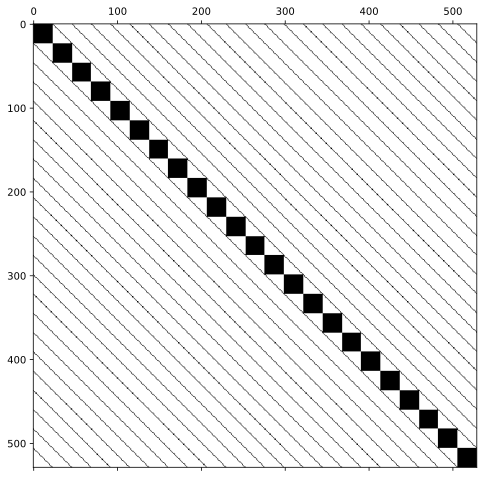

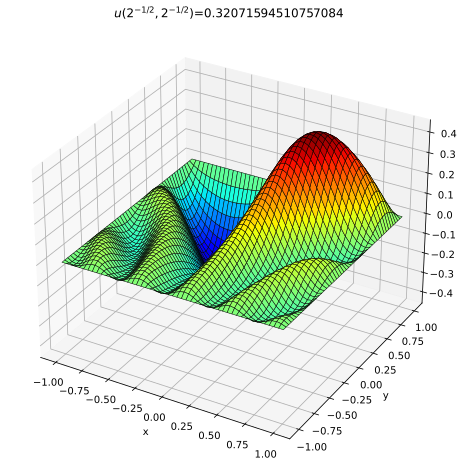

In [30]:
N = 24; D,x = cheb(N); y = x;
xx,yy = meshgrid(x[1:N],y[1:N])
xx = reshape(xx,(N-1)**2)
yy = reshape(yy,(N-1)**2)
f = 10*sin(8*xx*(yy-1))
D2 = dot(D,D); D2 = D2[1:N,1:N]; I = eye(N-1)
L = kron(I,D2) + kron(D2,I)
# Plot sparsity pattern
figure(figsize=(8,8)), spy(L)
# Solve Lu=f
u = solve(L,f)
# Convert 1-d vectors to 2-d
uu = zeros((N+1,N+1)); uu[1:N,1:N] = reshape(u,(N-1,N-1))
[xx,yy] = meshgrid(x,y)
value = uu[N//4,N//4]

# Interpolate to finer mesh just for visualization
f = interp2d(x,y,uu,kind='cubic')
#f = RegularGridInterpolator((x,y,uu),method='cubic')
xxx = linspace(-1.0,1.0,50)
uuu = f(xxx,xxx)
fig = figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
X,Y = meshgrid(xxx,xxx)
ax.plot_surface(X,Y,uuu,rstride=1,cstride=1,cmap=cm.jet,edgecolor='black', linewidth=0.5)
title("$u(2^{-1/2},2^{-1/2})$="+str(value))
xlabel("x"); ylabel("y");



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 16. Program 16 solves the Poisson problem (7.4) numerically with $\,N\,=\,24\,$. The upper plot shows the locations of the 23,805 nonzero entries in the 529$\scriptsize{\times}$529 matrix $\,L_{24}\,$. The lower plot shows the solution and prints the value for $\,x\,=\,y\,=\,2^{-1/2}\,$, which is convenient because this is one of the grid points whenever $\,N\,$ is divisible by 4.

</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 17 : Hemholtz equation




</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>$$ 
u_{xx} + u_{yy} + k^{2}u = f, \qquad \mbox{on} \qquad [-1,1] \scriptsize{\times} \small{[-1,1]}
$$

A minor modification of p16 to solve such a problem for the particular choices as follows:

$$
k = 9, \qquad f(x,y) = \exp (-10[(y-1)^2 +(x-1/2)^2])
$$
</font>
</div>

In [33]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#from chebPy import cheb
from numpy import meshgrid,sin,dot,eye,kron,zeros,reshape,exp,linspace
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import figure,subplot,plot,title,axis,xlabel,ylabel,contour
from matplotlib import cm
from scipy.linalg import solve
from scipy.interpolate import interp2d



C:\Users\gary\AppData\Local\Temp\ipykernel_11028\3985173310.py:16: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  f = interp2d(x,y,uu,kind='cubic')
C:\Users\gary\AppData\Local\Temp\ipykernel_11028\3985173310.py:18: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
        scattered 2D data

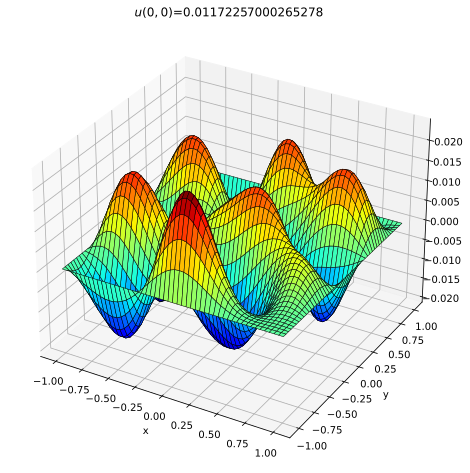

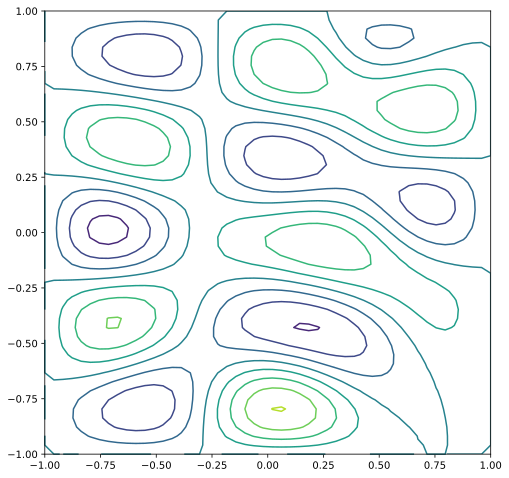

In [34]:
N = 24; D,x = cheb(N); y = x;
xx,yy = meshgrid(x[1:N],y[1:N])
xx = reshape(xx,(N-1)**2)
yy = reshape(yy,(N-1)**2)
f = exp(-10*((yy-1)**2 + (xx - 0.5)**2 ))
D2 = dot(D,D); D2 = D2[1:N,1:N]; I = eye(N-1)
k = 9
L = kron(I,D2) + kron(D2,I) + k**2*eye((N-1)**2)
# Solve Lu=f
u = solve(L,f)
# Convert 1-d vectors to 2-d
uu = zeros((N+1,N+1)); uu[1:N,1:N] = reshape(u,(N-1,N-1))
[xx,yy] = meshgrid(x,y)
value = uu[N//2,N//2]

f = interp2d(x,y,uu,kind='cubic')
xxx = linspace(-1.0,1.0,50)
uuu = f(xxx,xxx)

fig = figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
[X ,Y] = meshgrid(xxx,xxx)
ax.plot_surface(X,Y,uuu,rstride=1,cstride=1,cmap=cm.jet,edgecolor='black', linewidth=0.5)
title("$u(0,0)$="+str(value))
xlabel("x"); ylabel("y");

figure(figsize = (8,8))
contour(X,Y,uuu);























<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Decoding the contour plot. Peaks are light green, troughs are dark blue. The highest peak is at about x=0.05, y=-0.82, and can be located on the upper plot as the only one with dark red or brown shading.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Relevant comments pertaining to Programs 15, 16, and 17. Homogeneous Dirichlet boundary conditions for spectral collocation methods can be implemented by simply deleting the first and/or last rows and columns of a spectral differentiation matrix. Problems in two space dimensions can be formulated in terms of Kronecker products, and for moderate-sized grids, they can be solved that way on the computer. Nonlinear problems can be solved by iteration.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 18 : Chebyshev differentiation via FFT. (This marks the transition from the supporting function _cheb_ to the function _chebfft_.


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Calculate the Chebyshev derivative of $f(x)\,=\,e^x\,\textrm{sin}(5x)\,$ for $\,N\,=\,$ 10 and 20 using the FFT.
</font>
</div>

In [35]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#from chebfftPy import chebfft
from numpy import pi,linspace,sin,cos,exp,round,zeros,arange,real, flipud
from numpy.fft import fft,ifft
from matplotlib.pyplot import figure,subplot,plot,grid,title,axis



In [36]:
from numpy import pi,cos,arange,array, flipud,\
     real,zeros, sqrt
from numpy.fft import fft,ifft

def chebfft(v):
    '''Chebyshev differentiation via fft.
       Ref.: Trefethen's 'Spectral Methods in MATLAB' book.
    '''
    N = len(v)-1
    if N == 0:
        w = 0.0 # only when N is even!
        return w
    x  = cos(pi*arange(0,N+1)/N)
    ii = arange(0,N)
    V = flipud(v[1:N]); V = list(v) + list(V);
    U = real(fft(V))
    b = list(ii); b.append(0); b = b + list(arange(1-N,0));
    w_hat = 1j*array(b)
    w_hat = w_hat * U
    W = real(ifft(w_hat))
    w = zeros(N+1)
    w[1:N] = -W[1:N]/sqrt(1-x[1:N]**2)
    w[0] = sum(ii**2*U[ii])/N + 0.5*N*U[N]
    w[N] = sum((-1)**(ii+1)*ii**2*U[ii])/N + \
              0.5*(-1)**(N+1)*N*U[N]
    return w
 
 


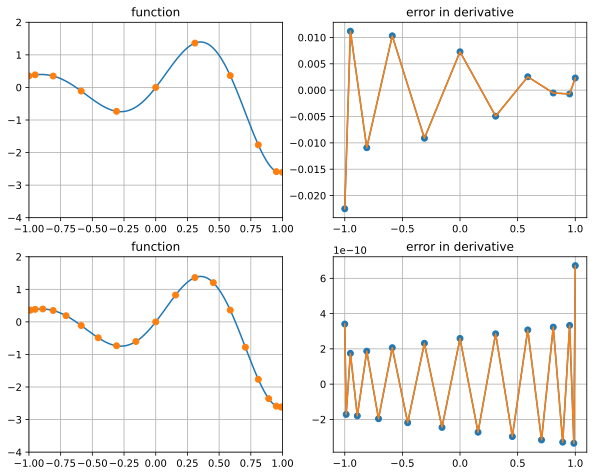

In [51]:
figure(figsize=(10,12))
plot_count = 1

for N in [10,20]:
    xx = linspace(-1.0,1.0,100)
    ff = exp(xx)*sin(5*xx)
    x = cos(arange(0,N+1)*pi/N)
    f = exp(x)*sin(5*x)
    error = chebfft(f) - exp(x)*(sin(5*x)+5*cos(5*x))
    subplot(3,2,plot_count)
    plot_count +=1
    plot(xx,ff,'-',x,f,'o')
    grid(True)
    axis([-1, 1, -4,2])
    title('function')
    subplot(3,2,plot_count)
    plot_count +=1
    plot(x,error,'-o')
    title('error in derivative')
    plot(x,error) 
    grid(True)
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 18. Compare results with output 11, which illustrates the same calculation using matrices (instead of FFT). The differences are at the level of rounding errors.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 19 : Second order Wave Equation on Chebyshev Grid


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve
$$
u_{tt} = u_{xx}, \qquad -1 < x < 1,   \qquad t > 0
$$

with boundary condition

$$
u(\pm 1,t) = 0
$$

and initial condition

$$
u(x,0) = e^{-200 x^2}
$$
</font>
</div>

In [46]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#from chebfftPy import chebfft
from numpy import arange,cos,zeros,round,exp,pi
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import PolyCollection
from matplotlib.collections import LineCollection
from matplotlib.pyplot import figure



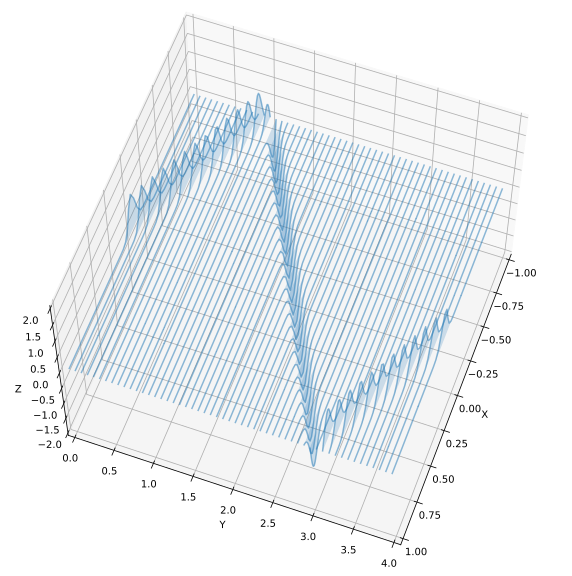

In [68]:
# Time-stepping by Leap Frog Formula:
N = 80; t = 0.0 ;x = cos(pi*arange(0,N+1)/N);dt = 8.0/(N**2);
v = exp(-200*x**2); vold = exp(-200*(x-dt)**2);
tmax = 4 ; tplot = 0.075;
plotgap = int(round(tplot/dt)); dt = tplot/plotgap;
nplots = int(round(tmax/tplot));
plotdata = []; plotdata.append(list(zip(x,v)));
tdata = []; tdata.append(0.0)
for i in range(1,nplots):
    for n in range(plotgap):
        t = t + dt
        w = chebfft(chebfft(v)); w[0] = 0.0; w[N] = 0.0; 
        vnew = 2*v - vold + dt**2*w; vold = v; v = vnew;
    plotdata.append(list(zip(x,v)));
    tdata.append(t);

fig = figure(figsize=(10,12))
ax = fig.add_subplot(111,projection='3d')
poly = LineCollection(plotdata)
poly.set_alpha(0.5)
ax.add_collection3d(poly, zs=tdata, zdir='y')
ax.set_xlabel('X')
ax.set_xlim3d(-1, 1)
ax.set_ylabel('Y')
ax.set_ylim3d(0, tmax)
ax.set_zlabel('Z')
ax.set_zlim3d(-2, 2)
ax.view_init(60,20)

polyp = PolyCollection(plotdata)
polyp.set_alpha(0.2)
ax.add_collection3d(polyp, zs=tdata, zdir='y')



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 20 : Second order Wave Equation using FFT


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve the wave equation in 2-d

$$
u_{tt} = u_{xx}+u_{yy}, \qquad -1 < x,y < 1, \qquad t >0
$$

with $u = 0$ on the boundary and initial condition

$$
u(x,y,0) = e^{-40((x-0.4)^2 + y^2)}, \qquad u_{t}(x,y,0) = 0
$$
</font>
</div>

In [10]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
from numpy import meshgrid,cos,pi,round,exp,real,remainder,zeros,fliplr,flipud,array,arange
from numpy.fft import fft, ifft
from matplotlib.pyplot import subplot, figure ,title,axis
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import figure,subplot,plot,title,axis,xlabel,ylabel
from matplotlib import cm
from scipy.interpolate import interp2d



C:\Users\gary\AppData\Local\Temp\ipykernel_8112\3484298906.py:16: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  f = interp2d(x,y,vv,kind='cubic');
C:\Users\gary\AppData\Local\Temp\ipykernel_8112\3484298906.py:18: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
        scattered 2D data.

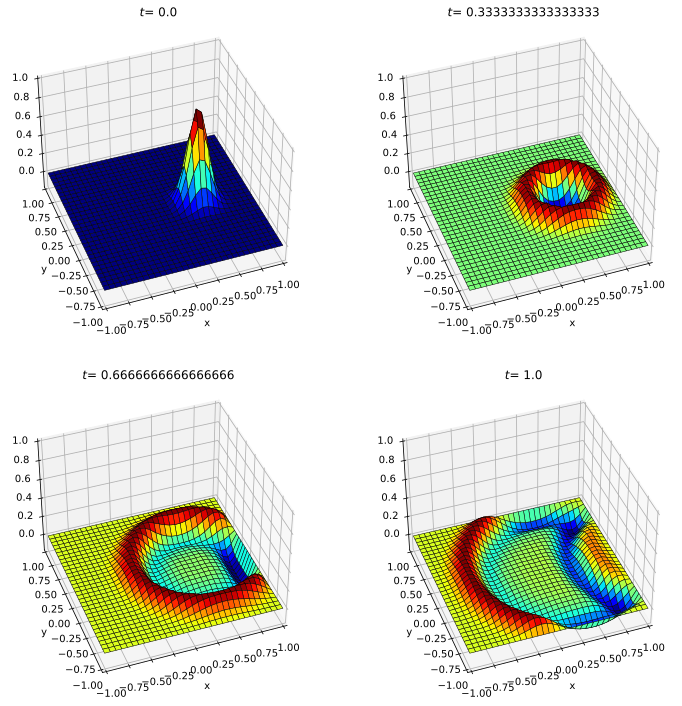

In [11]:
# Grid and inital Data:
N = 24; x = cos(pi*arange(0,N+1)/N); y = x;
t = 0.0; dt = (6.0)/(N**2)
xx, yy = meshgrid(x,y)
plotgap = int (round( (1.0/3.0) / (dt))); dt = (1.0/3.0)/(plotgap);            
vv = exp(-40*((xx-0.4)**2 + yy**2));
vvold = vv; 

#Time stepping Leapfrog Formula:
fig = figure(figsize=(12,12))
k = 1;
for n in range(0,(3*plotgap)+1):
    t = n*dt;
    if (remainder(n+0.5,plotgap) < 1):
        ax = fig.add_subplot(2,2,k,projection ='3d')
        f = interp2d(x,y,vv,kind='cubic');
        xxx = arange(-1.,1.+1./16,1./16);
        vvv = f(xxx,xxx)
        X,Y = meshgrid(xxx,xxx);
        ax.plot_surface(X,Y,vvv,rstride=1,cstride=1,cmap=cm.jet,edgecolor='black', linewidth=0.5)
        ax.set_zlim3d([-0.15,1])
        ax.set_xlim3d([-1,1])
        ax.set_ylim3d([-1,1])
        ax.view_init(elev=40., azim=250.)
        title("$ t $= " +str(t))
        xlabel("x"); ylabel("y");
        k = k+1;
    
    uxx = zeros((N+1,N+1)); uyy = zeros((N+1,N+1));
    ii = arange(1,N);
    
    for i in range(1,N):
        v = vv[i,:];          
        V = list(v) + list(flipud(v[ii]));
        U = real(fft(V));
        w1_hat = 1j*zeros(2*N);
        w1_hat[0:N] = 1j*arange(0,N)
        w1_hat[N+1:] = 1j*arange(-N+1,0)
        W1 = real(ifft(w1_hat * U))
        w2_hat = 1j*zeros(2*N);
        w2_hat[0:N+1] = arange(0,N+1)
        w2_hat[N+1:] = arange(-N+1,0)
        W2 = real(ifft((-w2_hat**2) * U))
        uxx[i,ii] = W2[ii]/(1-x[ii]**2) - (x[ii]*W1[ii])/(1-x[ii]**2)**(3.0/2);
    for j in range(1,N):
        v = vv[:,j]; 
        V = list(v) + list(flipud(v[ii]));
        U = real(fft(V))
        w1_hat = 1j*zeros(2*N);
        w1_hat[0:N] = 1j*arange(0,N)
        w1_hat[N+1:] = 1j*arange(-N+1,0)
        W1 = real(ifft(w1_hat * U))
        w2_hat = 1j*zeros(2*N);
        w2_hat[0:N+1] = arange(0,N+1)
        w2_hat[N+1:] = arange(-N+1,0)
        W2 = real(ifft(-(w2_hat**2) * U))
        uyy[ii,j] = W2[ii]/(1-y[ii]**2) - y[ii]*W1[ii]/(1-y[ii]**2)**(3.0/2.0);
    vvnew = 2*vv - vvold + dt**2 *(uxx+uyy)
    vvold = vv ; vv = vvnew;
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 20. Program 20 discretizes this problem with a leap frog formula again for the time discretizations and a Chebyshev spectral method on a tensor product grid in $\,x\,$ and $\,y\,$.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Relevant comments pertaining to Programs 19 and 20. Chebyshev differentiation can be carried out by the FFT. The underlying idea is that of transplantation from Chebyshev points on $\,[-1,1]\,$ to equally spaced points on the unit circle. Ideally, for real data, a real discrete cosine transform (DCT) should be used, but the general FFT is also applicable with a certain loss of efficiency.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 21 : Eigenvalues of Mathieu operator (periodic domain). The Mathieu equation comes up in problems of forced oscillations. The equation is

$$-u_{xx}\,+\,2q\,\textrm{cos}(2x)\,u\,=\,\lambda u\,$$

where $q$ is a real parameter, and periodic solutions on $\,[-\pi,\pi]\,$ are sought. For $\,q\,=\,0\,$ the linear pendulum equation of Program 15 appears, with eigenvalues $\,n^2/4\,$ for $\,n\,=\,1,2,3,\ldots .\,$ The scientific interest arises in the behavior of these eigenvalues as $\,q\,$ is increased.


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Discretize the Mattieu equation above and solve for eigenvalues in the domain $\,[0,2\pi]\,$, employing a Fourier differentiation matrix.
</font>
</div>

In [13]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from numpy import pi,arange,sin,cos,zeros,diag,sort,real
from scipy.linalg import toeplitz
from numpy.linalg import eig
from itertools import cycle
from matplotlib.pyplot import figure,plot,xlabel,ylabel
%config InlineBackend.figure_formats = ['svg']



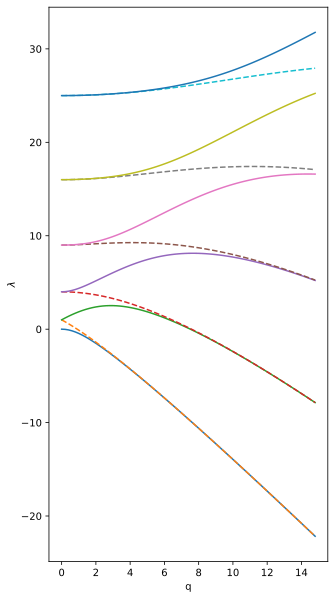

In [60]:
N = 42; h = 2.0*pi/N; x = h*arange(1,N+1)
col = zeros(N)
col[0] = -pi**2/(3.0*h**2) - 1.0/6.0
col[1:] = -0.5*(-1.0)**arange(1,N)/sin(0.5*h*arange(1,N))**2
D2 = toeplitz(col)

ne = 11 # number of eigenvalues to plot
qq = arange(0.0, 15.0, 0.2)
data= zeros((len(qq),ne))
i = 0
for q in qq:
    evals,evecs = eig(-D2 + 2.0*q*diag(cos(2.0*x)))
    e = real(sort(evals))
    data[i,:] = e[0:ne]
    i = i + 1
    
figure(figsize=(5,10))
lines=cycle(["-","--"])
for i in range(ne):
    plot(qq,data[:,i],next(lines))
xlabel("q")
ylabel("$\lambda$");
        
        

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 21. With $\,N\,=\,42\,$, about 13 digits of accuracy are obtained. The curves traced above are those of the first 11 eigenvalues as $\,q\,$ increases from 0 to 15.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 22 : 5th eigenvector of Airy equation

Traditionally, the Airy equation is posed on the real line,

$$u_{xx}\,=\,x\,u \hspace{2 cm}x\,\in\,\mathbb{R}$$

This is the canonical example of an ODE that changes type in different parts of the domain. For $\,x<0\,$, the behavior is oscillatory, while for $\,x>0\,$, growing and decaying exponential solutions are presented. Being an ODE of second order, the Airy equation has a two-dimensional linear space of solutions, and the standard basis for this space is the pair of Airy functions $\,Ai(x)\,$, which decays exponentially as $\,x\rightarrow\infty\,$, and $\,Bi(x)\,$, which grows exponentially.


</font>
</div>

In [63]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#from chebPy import *
from numpy import dot,diag,real,argsort,zeros,linspace,polyval,polyfit,where
from scipy.linalg import eig
from scipy.special import airy
from matplotlib.pyplot import figure,subplot,plot,title



C:\Users\gary\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


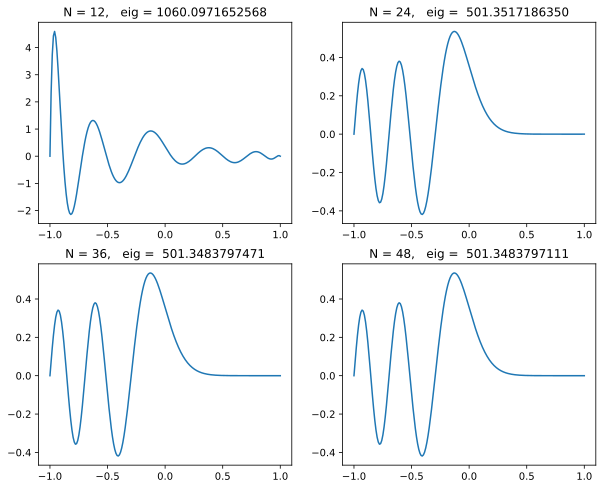

In [64]:
figure(figsize=(10,8))
for N in range(12,60,12):
    D,x = cheb(N); D2 = dot(D,D); D2 = D2[1:N,1:N]
    Lam,V = eig(D2,diag(x[1:N]))
    Lam = real(Lam); ii = where(Lam>0)[0]
    V = real(V[:,ii]); Lam = Lam[ii]
    ii = argsort(Lam); ii=ii[4]; Lam=Lam[ii]
    v = zeros(N+1); v[1:N] = V[:,ii]; v = v/v[N//2]*airy(0.0)[0]
    xx = linspace(-1.0,1.0,200); vv = polyval(polyfit(x,v,N),xx);
    subplot(2,2,N//12); plot(xx,vv)
    title("N = %d,   eig = %15.10f"%(N,Lam));
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 23 : Eigenvalues of perturbed Laplacian


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>solve the following eigenvalue problem

$$
-(u_{xx} + u_{yy}) + f(x,y) u = \lambda u, \qquad -1 < x,y < 1, \qquad u=0 \quad \mbox{on boundary}
$$

where

$$
f(x,y) = \exp(20(y-x-1))
$$
</font>
</div>

In [66]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#from chebPy import cheb
from numpy import meshgrid,dot,eye,kron,zeros,reshape,pi,real,imag
from numpy import diag,exp,argsort,linspace,inf
from matplotlib.pyplot import figure,subplot,plot,title,contour
from scipy.linalg import eig,norm
from scipy.interpolate import interp2d



C:\Users\gary\AppData\Local\Temp\ipykernel_7648\26879621.py:20: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  f = interp2d(x,y,uu,kind='cubic')
C:\Users\gary\AppData\Local\Temp\ipykernel_7648\26879621.py:21: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
        scattered 2D data.

   

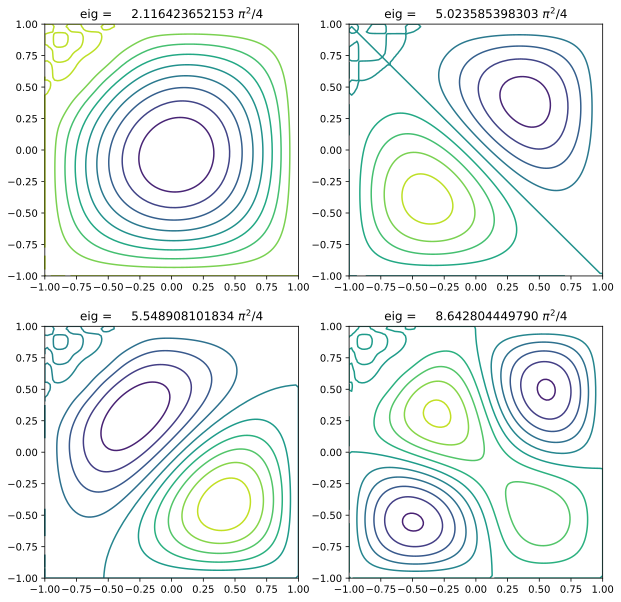

In [67]:
# Set up tensor product Laplacian and compute 4 eigenmodes
N = 16; D,x = cheb(N); y = x;
xx,yy = meshgrid(x[1:N],y[1:N])
xx = reshape(xx,(N-1)**2)
yy = reshape(yy,(N-1)**2)
D2 = dot(D,D); D2 = D2[1:N,1:N]; I = eye(N-1)
L = -kron(I,D2) - kron(D2,I)
L = L + diag(exp(20*(yy-xx-1)))
D,V = eig(L); D = real(D); V = real(V)
ii = argsort(D); ii = ii[0:4]; D = D[ii]; V = V[:,ii]

# Reshape them to 2D grid, interpolate to finer grid, and plot
fine = linspace(-1.0,1.0,100,True);
uu = zeros((N+1,N+1));

figure(figsize=(10,10))
for i in range(4):
    uu[1:N,1:N] = reshape(V[:,i],(N-1,N-1))
    uu = uu/norm(uu,inf)
    f = interp2d(x,y,uu,kind='cubic')
    uuu = f(fine,fine)
    subplot(2,2,i+1)
    contour(fine,fine,uuu,10)
    title("eig = %18.12f $\pi^2/4$"%(D[i]/(pi**2/4)))
    
  













<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 23. The computed eigenvalues are not spectrally accurate; the function $f$ varies too fast to be well resolved on this grid. Experiments with various values of $N$ suggest they are accurate to about three or four digits.



</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 24 : Pseudospectra of Davies complex harmonic oscillator

Note: This problem requires more than the average time allotment for processing.




</font>
</div>

In [74]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#from chebPy import cheb
from numpy import dot,argsort,zeros,real,imag,meshgrid,eye,diag,arange
from scipy.linalg import solve,eig,svd,svdvals
from matplotlib.pyplot import figure,plot,title,axis,contour



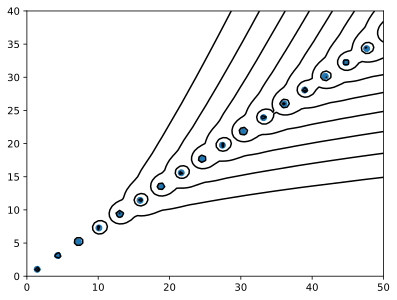

In [75]:
N = 70; D, x = cheb(N); x = x[1:N];
L = 6.0; x = L*x; D = D/L;
A = -dot(D,D);
A = A[1:N,1:N] + (1+3j)*diag(x**2);
lam, v = eig(A)
fig = figure()
plot(real(lam),imag(lam),"o")
axis([0, 50, 0, 40])

h = 0.5 #Smaller the value, finer the plot
x = arange(0,50+h,h); y = arange(0,40+h,h); xx,yy = meshgrid(x,y);
zz = xx + 1j*yy;
I = eye(N-1); sigmin = zeros((len(y),len(x))) 
for j in range(0,len(x)):
    for i in range(0,len(y)):
        sigmin[i,j] = min(svdvals(zz[i,j]*I - A));

levels = 10.0**arange(-4.5,0.0,0.5);
contour(x,y,sigmin,levels,colors = 'k');



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Relevant comments pertaining to Programs 21 through 24. Spectral discretization can turn eigenvalue and pseudospectra problems for ODEs and PDEs into the corresponding problems for matrices. If the matrix dimension is large, it may be best to solve these by Krylov subspace methods such as the Lanczos or Arnoldi iterations.



</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 25 : Stability regions for ODE formulas


</font>
</div>

In [76]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from numpy import pi,real,imag,zeros,exp,arange
from matplotlib.pyplot import figure,subplot,plot,axis,grid,title



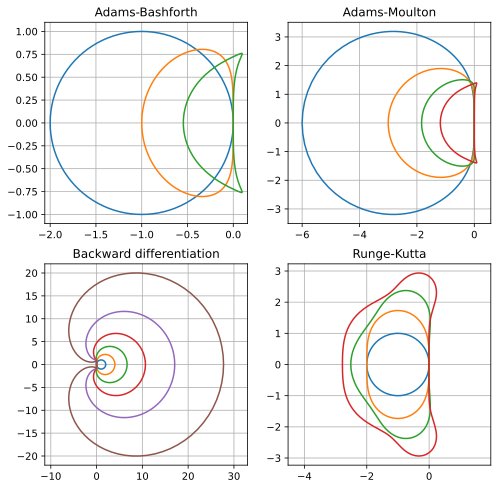

In [77]:
figure(figsize=(8,8))

# Adams-Bashforth
subplot(2,2,1)
z = exp(1j*pi*arange(0,201)/100); r = z - 1
s = 1; rr = r/s; plot(real(rr),imag(rr))
s = (3 - 1/z)/2; rr = r/s; plot(real(rr),imag(rr))
s = (23 - 16/z + 5/z**2)/12; rr = r/s; plot(real(rr),imag(rr))
axis('equal'); grid('on')
title('Adams-Bashforth')

# Adams-Moulton
subplot(2,2,2)
s = (5*z + 8 - 1/z)/12; rr = r/s; plot(real(rr),imag(rr))
s = (9*z + 19 - 5/z + 1/z**2)/24; rr = r/s; plot(real(rr),imag(rr))
s = (251*z + 646 - 264/z + 106/z**2 - 19/z**3)/720; rr = r/s; plot(real(rr),imag(rr))
d = 1 - 1/z
s = 1 - d/2 - d**2/12 - d**3/24 - 19*d**4/720 - 3*d**5/160; dd = d/s; plot(real(dd),imag(dd))
axis('equal'); grid('on')
title('Adams-Moulton')

# Backward differentiation
subplot(2,2,3)
r = 0
for i in range(1,7):
    r = r + d**i/i; plot(real(r),imag(r))
axis('equal'); grid('on')
title('Backward differentiation')

# Runge-kutta
subplot(2,2,4)
w = 0; W = 1j*zeros(len(z)); W[0] = w;
for i in range(1,len(z)):
    w = w - (1+w-z[i]); W[i] = w
plot(real(W),imag(W))
w = 0; W = 1j*zeros(len(z)); W[0] = w;
for i in range(1,len(z)):
    w = w - (1+w+0.5*w**2-z[i]**2)/(1+w); W[i] = w
plot(real(W),imag(W))
w = 0; W = 1j*zeros(len(z)); W[0] = w;
for i in range(1,len(z)):
    w = w - (1+w+0.5*w**2+w**3/6-z[i]**3)/(1+w+0.5*w**2); W[i] = w
plot(real(W),imag(W))
w = 0; W = 1j*zeros(len(z)); W[0] = w;
for i in range(1,len(z)):
    w = w - (1+w+0.5*w**2+w**3/6+w**4/24-z[i]**4)/(1+w+w**2/2+w**3/6); W[i] = w
plot(real(W),imag(W))
axis('equal'); grid('on')
title('Runge-Kutta');



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 25. Stability regions for four families of ODE finite difference formulas. For backward differentiation, the stability regions are the exteriors of the curves; in the other cases they are the interiors.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 26 : Eigenvalues of 2nd-order Chebyshev differential matrix

Consider the spatial discretization operator of Program 19, which is $\,\tilde{D}_N^2\,$. It is asserted that the eigenvalues of $\,\tilde{D}_N^2$ are negative and real, with the largest being approximately -0.048$N^4$. Program 26 calculates the eigenvalues of $\,\tilde{D}_N^2\,$ and plots one of the physically meaningful eigenvectors and one of the physically meaningless ones.


</font>
</div>

In [78]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#from chebPy import *
from numpy import dot,argsort,diag,real,imag,pi,array,polyfit,polyval,zeros
from numpy.linalg import eig
from matplotlib.pyplot import figure,loglog,semilogy,plot,title,ylabel,text,xlim



C:\Users\gary\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


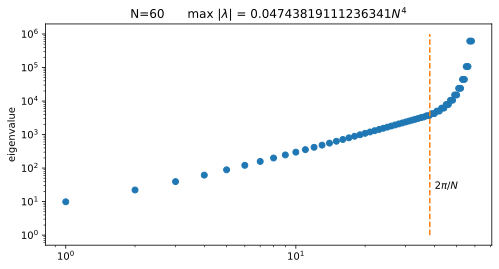

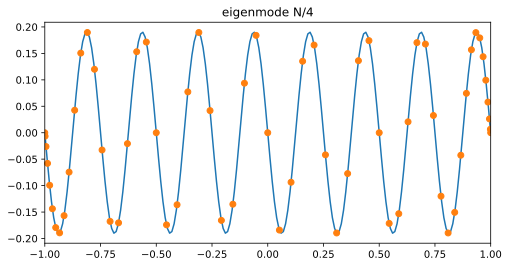

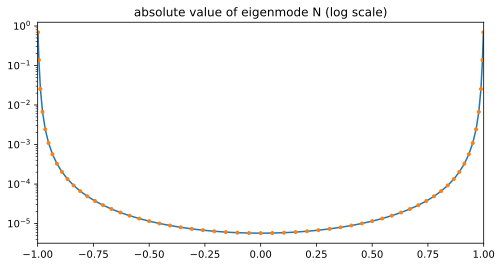

In [79]:
N = 60; D, x = cheb(N); D2 = dot(D,D); D2 = D2[1:N,1:N]
Lam, V = eig(D2)
ii = argsort(-Lam); e = Lam[ii]; V = V[:,ii]

# Plot eigenvalues
figure(figsize=(8,4))
loglog(-e,'o')
semilogy(2*N/pi*array([1,1]),array([1,1e6]),'--')
ylabel('eigenvalue')
title('N='+str(N)+'      max |$\lambda$| = '+str(max(-e)/N**4)+'$N^4$')
text(2.1*N/pi,24,'$2\pi/N$')

# Plot eigenmode N/4 (physical)
figure(figsize=(8,4))
vN4 = zeros(N+1)
vN4[1:N] = V[:,N//4];
xx = arange(-1.0,1.01,0.01)
vv = polyval(polyfit(x,vN4,N),xx)
plot(xx,vv,'-')
plot(x,vN4,'o')
xlim((-1.0,1.0))
title('eigenmode N/4')

# Plot eigenmode N (nonphysical)
figure(figsize=(8,4))
vN = V[:,N-2]
semilogy(x[1:N],abs(vN))
plot(x[1:N],abs(vN),'.')
xlim((-1.0,1.0))
title('absolute value of eigenmode N (log scale)');


<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Above: Output 26. The top plot shows the sorted eigenvalues of $\,\tilde{D}_N^2\,$. A fraction approximately $2/\pi$ of them correspond to good approximations of the sinusoidal eigenmodes of $\,u_{xx}\,=\,\lambda u, \, u(\pm1)\,=\,0\,$. Mode $N/4$ is one such, whereas mode $N$ is spurious and localized near the boundaries $-$ note the log scale.


</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 27 models the KdV equation by a Fourier spectral method on $[-\pi,\pi]$, which is appropriate since the effect of boundary conditions is not of interest, and the solutions at issue decay exponentially. This is the first nonlinear time-dependent equation considered so far, but the nonlinearity causes little trouble for an explicit time-stepping method. The time-discretization scheme in this program is the fourth-order Runge-Kutta formula, which is described in numerous books.


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve the KdV equation using FFT

$$
u_t + u u_x + u_{xxx} = 0, \qquad x \in [-\pi,\pi]
$$
</font>
</div>

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import LineCollection
from matplotlib.collections import PolyCollection
from numpy import pi,cosh,exp,round,zeros,arange,real
from numpy.fft import fft,ifft
from matplotlib.pyplot import figure



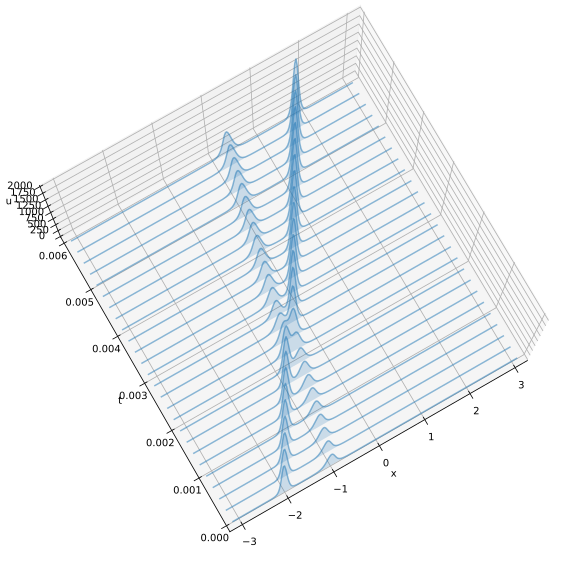

In [4]:
# Set up grid and differentiation matrix:
N = 256; dt = 0.4/N**2; x = (2*pi/N)*arange(-N/2,N/2);
A, B = 25.0, 16.0
u = 3*A**2/cosh(0.5*A*(x+2))**2 + 3*B**2/cosh(0.5*B*(x+1))**2
v = fft(u); 
k = zeros(N); k[0:N//2] = arange(0,N/2); k[N//2+1:] = arange(-N/2+1,0,1)
ik3 = 1j*k**3

# Time-stepping by Runge-Kutta
tmax = 0.006; nplt = int(round((tmax/25)/dt))
nmax = int(round(tmax/dt))
udata = []; udata.append(list(zip(x, u)))
tdata = [0.0]
for n in range(1,nmax+1):
    t = n*dt; g = -0.5j*dt*k
    E = exp(dt*ik3/2); E2 = E**2
    a = g * fft(real(ifft( v         ))**2)
    b = g * fft(real(ifft( E*(v+a/2) ))**2)
    c = g * fft(real(ifft( E*v+b/2   ))**2)
    d = g * fft(real(ifft( E2*v+E*c  ))**2)
    v = E2*v + (E2*a + 2*E*(b+c) + d)/6
    if n%nplt == 0:
        u = real(ifft(v))
        udata.append(list(zip(x, u)))
        tdata.append(t);

fig = figure(figsize=(12,10))
ax = fig.add_subplot(111,projection='3d')
poly = LineCollection(udata)
poly.set_alpha(0.5)
ax.add_collection3d(poly, zs=tdata, zdir='y')
ax.set_xlabel('x')
ax.set_xlim3d(-pi, pi)
ax.set_ylabel('t')
ax.set_ylim3d(0, tmax)
ax.set_zlabel('u')
ax.set_zlim3d(0, 2000)
ax.view_init(80,-120);

polyp = PolyCollection(udata)
polyp.set_alpha(0.2)
ax.add_collection3d(polyp, zs=tdata, zdir='y')



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Program 27b : Solve KdV equation, with animation


</font>
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 15px 5px 10px 5px;
            border: 10px solid #FFE3CC;  
            margin-left: 1px;
            margin-right: 1px;"
     
<font color='blue'>Solve the KdV equation using FFT

$$
u_t + u u_x + u_{xxx} = 0, \qquad x \in [-\pi,\pi]
$$
</font>
</div>

In [14]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
from matplotlib import rc
rc('animation', html='jshtml')
from numpy import pi,cosh,exp,round,zeros,arange,real,mod
from numpy.fft import fft,ifft
import matplotlib.pyplot as plt
%config InlineBackend.figure_formats = ['svg']



In [15]:
# Set up grid and differentiation matrix:
N = 256; dt = 0.4/N**2; x = (2*pi/N)*arange(-N/2,N/2);
A, B = 25.0, 16.0
u = 3*A**2/cosh(0.5*A*(x+2))**2 + 3*B**2/cosh(0.5*B*(x+1))**2
v = fft(u); 
k = zeros(N); k[0:N//2] = arange(0,N/2); k[N//2+1:] = arange(-N/2+1,0,1)
ik3 = 1j*k**3

# Time-stepping by Runge-Kutta
tmax = 0.006; nplt = 5 #int(round((tmax/25)/dt))
nmax = int(round(tmax/dt))
udata = []; udata.append(u)
tdata = [0.0]
for n in range(1,nmax+1):
    t = n*dt; g = -0.5j*dt*k
    E = exp(dt*ik3/2); E2 = E**2
    a = g * fft(real(ifft( v         ))**2)
    b = g * fft(real(ifft( E*(v+a/2) ))**2)
    c = g * fft(real(ifft( E*v+b/2   ))**2)
    d = g * fft(real(ifft( E2*v+E*c  ))**2)
    v = E2*v + (E2*a + 2*E*(b+c) + d)/6
    if mod(n,nplt) == 0:
        u = real(ifft(v))
        udata.append(u)
        tdata.append(t);
        
        

MovieWriter ffmpeg unavailable; using Pillow instead.


Cannot save mp4 file


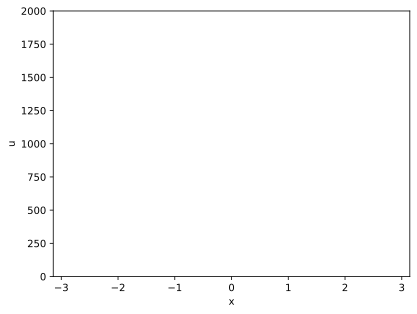

In [16]:
from matplotlib import animation

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(-pi, pi), ylim=(0, 2000))
line, = ax.plot([], [], lw=2)
plt.xlabel('x'); plt.ylabel('u')

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    line.set_data(x, udata[i])
    return line,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=len(udata), interval=50, blit=True)
# Save to file
try:
    anim.save('p27.mp4', fps=20, extra_args=['-vcodec', 'libx264'])
except:
    print("Cannot save mp4 file")
    
    

In [19]:
# Use this for inline display with controls
anim

# Use this for inline display of movie
#from IPython.display import HTML
#HTML(anim.to_html5_video())



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>As the time axis moves, the animation allows the viewer to watch the wave ridges "pass through one another" (see static plot for orientation).

</font>
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 100;
            padding: 10px 5px 10px 5px; 
            border: 10px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>Relevant comments pertaining to Programs 25 through 27. As a rule of thumb, stability of spectral methods for time-dependent PDEs requires that the eigenvalues of the spatial discretization operator, scaled by $\Delta t$, lie in the stability region of the time-stepping formula. Because of large eigenvalues, especially in the Chebyshev case, time step limits for explicit methods may be very severe, making it advantageous to use implicit or semi-implicit methods.


</font>
</div>